In [91]:
import numpy as np
import matplotlib.pyplot as plt

In [93]:
nstates = 6
n_test = 3
n_atom = 10
n_neighb = 5
%pwd

'D:\\code\\GraphVampNet-main\\GraphVampNet-main'

In [94]:
import numpy as np
import scipy.stats


def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

In [95]:
def estimate_koopman_op(trajs, tau, is_list = False):
    if type(trajs) == list or is_list:
        traj = np.concatenate([t[:-tau] for t in trajs], axis=0)
        traj_lag = np.concatenate([t[tau:] for t in trajs], axis=0)
    else:
        traj = trajs[:-tau]
        traj_lag = trajs[tau:]
    c_0 = np.transpose(traj)@traj
    c_tau = np.transpose(traj)@traj_lag
    
    eigv, eigvec = np.linalg.eig(c_0)
    include = eigv > 1e-7
    eigv = eigv[include]
    eigvec = eigvec[:, include]
    c0_inv = eigvec @ np.diag(1/eigv) @ np.transpose(eigvec)
    
    koopman_op = c0_inv @ c_tau
    return koopman_op

In [96]:
def get_its(traj, lags):
    '''
    implied timescales from a trajectory estimated at a series of lag times
    
    parameters:
    ----------
    traj: [traj_timesteps, traj_dimensions]
    lags: [lagtimes]
    
    returns:
    ----------
    its: [traj_dim-1, lagtimes]
    '''
    if type(traj) == list:
        outputsize = traj[0].shape[1]
    else:
        outputsize = traj.shape[1]
    its = np.zeros((outputsize-1, len(lags)))
    
    for t, tau_lag in enumerate(lags):
        koopman_op = estimate_koopman_op(traj, tau_lag)
        k_eigvals, k_eigvec = np.linalg.eig(np.real(koopman_op))
        k_eigvals = np.sort(np.absolute(k_eigvals))
        k_eigvals = k_eigvals[:-1]
        its[:,t] = (-tau_lag/np.log(k_eigvals))
    return its

In [97]:
transformed = [] #[n_test, n_traj, n_trame, n_state]

for i in range(1,n_test+1):
    trans_temp = (np.load('src/ala_sch6_%u/transformed.npz'%i)['arr_0'])
    transformed.append(trans_temp) 

In [99]:
# take the argmax of each prob vector for hard state assignment
all_trajs = [] #[n_test, n_traj, n_trame]
for i in range(len(transformed)):
    trajs = []
    for j in range(len(transformed[i])): # 1 trajectory
        traj = []
        for k in range(len(transformed[i][j])): # length of each trajectory         
            traj.append(transformed[i][j][k].argmax())
        traj = np.array(traj)
        trajs.append(traj)
    
    all_trajs.append(trajs)




In [104]:
import matplotlib.gridspec as gridspec
#state_prob*100 # state probabilities
tau = 1
traj_whole, dihedral = np.load("src/data/alanine-dipeptide-3x250ns-heavy-atom-positions.npz")['arr_0'], \
                np.load("src/data/alanine-dipeptide-3x250ns-backbone-dihedrals.npz")['arr_0']

traj_data_points, input_size = traj_whole.shape
length_data = traj_data_points - tau
dihedral_init =  dihedral#[:length_data]

output_size = nstates


In [106]:
output_size = nstates
#n_states, trj, frame, #value
all_indexs = [[] for i in range(output_size)] #[n_states, n_traj, 1, nxxx]
all_states_num = [0 for i in range(output_size)]
all_states_prob=[]
for trj in range(len(transformed[0])):
    
    states_prob = transformed[0][trj]
    all_states_prob.append(states_prob)
    # Order the output states based on their population
    coor_pred = np.argmax(states_prob,  axis = 1) #max, states
    #
    indexes = [np.where(coor_pred == np.multiply(np.ones_like(coor_pred), n)) for n in range(output_size)] #[n_states, nxxx], frame idx
    states_num = [len(i[0]) for i in indexes]
    all_states_num =  [all_states_num[i] + states_num[i] for i in range(output_size)]
    for i in range(output_size):
        all_indexs[i].append(indexes[i])
    

In [107]:
states_order =  np.argsort(all_states_num).astype('int')[::-1]
states_order

array([4, 1, 3, 2, 5, 0])

In [108]:
n_states = 6
state_prob0 = [all_states_num[i]/sum(all_states_num) for i in range(n_states)]
state_prob0


[0.0015013333333333333,
 0.243712,
 0.10278133333333334,
 0.223048,
 0.40061066666666667,
 0.028346666666666666]

In [114]:
n_traj = len(transformed[0])
max_frame_id = []
max_frame_value=[0 for i in range(output_size)]
for state, n_idx in enumerate(all_indexs):
    va_idx = (-1,-1)
    for trj in range(n_traj):
        idx = all_indexs[state][trj]
        tmp = transformed[0][trj][:,state]
        #print(tmp[idx])
        if len(idx[0]) > 0:
            frame_id = idx[0][(tmp[idx]).argmax()]
            if np.max(tmp[idx]) != transformed[0][trj][frame_id][state]:
                print("ERROR")
            if transformed[0][trj][frame_id][state] > max_frame_value[state]:
                max_frame_value[state] = transformed[0][trj][frame_id][state]
                va_idx = (trj, frame_id)
    max_frame_id.append(va_idx)
max_frame_id

[(0, 94460), (1, 244252), (2, 3717), (2, 40723), (1, 160846), (0, 143595)]

In [115]:
max_frame_id_order = np.array(max_frame_id)[states_order]
max_frame_id_order

array([[     1, 160846],
       [     1, 244252],
       [     2,  40723],
       [     2,   3717],
       [     0, 143595],
       [     0,  94460]], dtype=int64)

In [116]:
states_order

array([4, 1, 3, 2, 5, 0])

In [118]:
states_num

[522, 60980, 24740, 54333, 99705, 9720]

In [119]:

# states_order
pred_ord = all_states_prob[0][:,states_order] 

In [ ]:
colors = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple','tab:brown','tab:pink', 'tab:gray','tab:olive','tab:cyan']

States population: [40.06106667 24.3712     22.3048     10.27813333  2.83466667  0.15013333]%


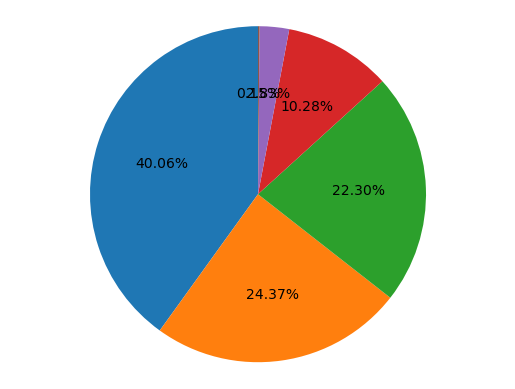

In [121]:

state_prob = np.array(state_prob0)[states_order]
state_prob

fig1, ax1 = plt.subplots()
ax1.pie(np.array(state_prob), autopct='%1.2f%%', startangle=90,colors=colors)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
print('States population: '+str(np.array(state_prob)*100)+'%')
plt.show()

[True]


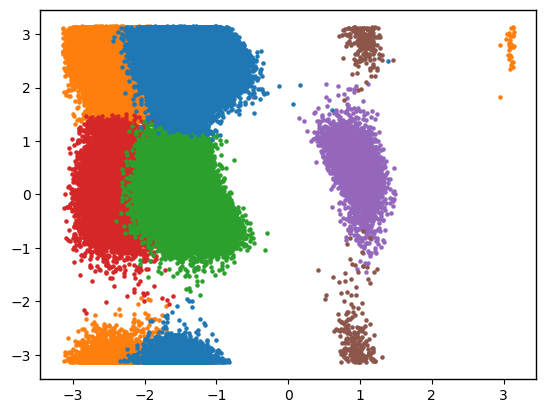

In [122]:
maxi_train = np.max(pred_ord, axis= 1)#
coor_train = np.zeros_like(pred_ord)
for i in states_order:#range(output_size)::
    coor_train = np.where(pred_ord[:,i]== maxi_train)[0] #
    plt.scatter(dihedral_init[coor_train,0], dihedral_init[coor_train,1], s=5, color=colors[i])
plt.axes = [[-np.pi, np.pi],[-np.pi, np.pi]]
print([i in range(-180,240, 60)])


C:\Users\DS00HY\AppData\Local\Temp\ipykernel_34104\3928730582.py:46: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


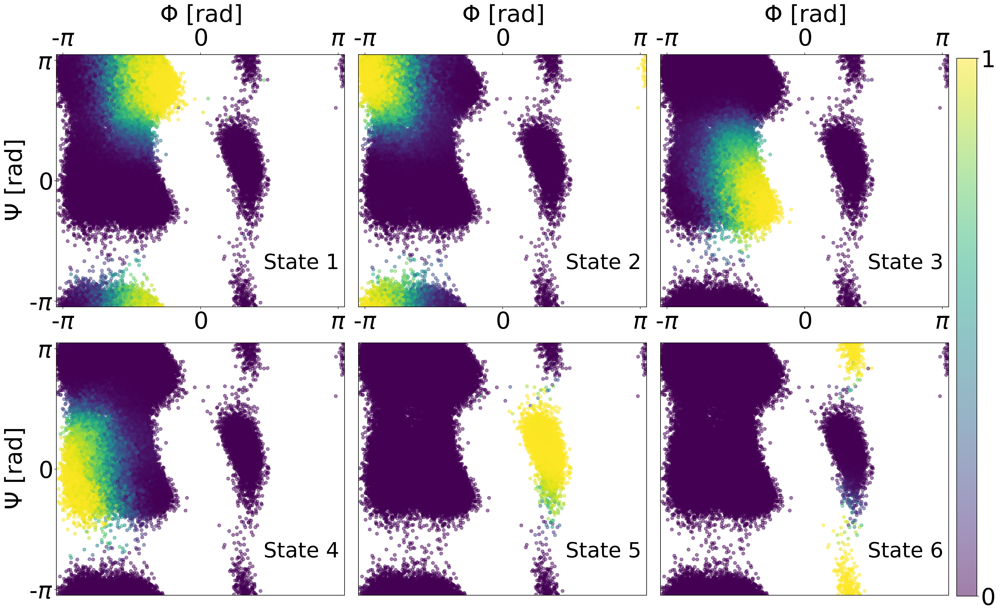

In [123]:
fig = plt.figure(figsize=(24, 16), dpi=300)

gs1 = gridspec.GridSpec(2, int(np.ceil(output_size/2)))
gs1.update(wspace=0.05, hspace = 0.05)

for n in range(output_size):
    ax = plt.subplot(gs1[n])
    im = ax.scatter(dihedral_init[:,0], dihedral_init[:,1], s=30,
                    c = pred_ord[:,n],
                    alpha=0.5,
                    vmin = 0, vmax = 1,
                    cmap='viridis'
                    )
    plt.axis('on')
    title = 'State '+str(n + 1)

    ax.text(.85, .15, title,
        horizontalalignment='center',
        transform=ax.transAxes,  fontdict = {'size':36})


    if (n < 3):
        ax.set_xticks([-3, 0, 3])
        ax.set_xticklabels([r'-$\pi$', r'$0$', r'$\pi$'])
        ax.xaxis.set_tick_params(top='on', bottom='off', labeltop='on', labelbottom='off')
        ax.xaxis.set_tick_params(labelsize=40)
    else:
        ax.set_xticks([])
    if (n%3==0):
        ax.set_yticks([-3, 0, 3])
        ax.set_yticklabels([r'-$\pi$', r'$0$', r'$\pi$'])
        ax.yaxis.set_tick_params(labelsize=40)
    else:
        ax.set_yticks([])
#    ax.set_aspect('equal')
    ax.set_xlim([-np.pi, np.pi]);
    ax.set_ylim([-np.pi, np.pi]);

    if (n%3 == 0):
        ax.set_ylabel(r'$\Psi$ [rad]', fontdict = {'size':40})
    if (n < 3):
        ax.set_xlabel(r'$\Phi$ [rad]', fontdict = {'size':40}, position = 'top')
        ax.xaxis.set_label_coords(0.5,1.2)

gs1.tight_layout(fig, rect=[0, 0.03, 0.95, 0.94])
fig.show()

cax = fig.add_axes([0.95, 0.05, 0.02, 0.8])
cbar = fig.colorbar(im, cax=cax, ticks=[0, 1])
cbar.ax.yaxis.set_tick_params(labelsize=40)
plt.savefig('ala_addcon.png')

In [124]:
sorted = np.array(states_order)#np.argsort(state_prob)[::-1] # sort them descending

In [125]:
sorted 

array([4, 1, 3, 2, 5, 0])

In [126]:
# the relation between states of different experiments
nstates = 6
state_rel = []
for i in range(n_test):
    rel = []
    for index in sorted:
        count = np.zeros(nstates)
        for j in range(len(all_trajs[i])): # number of trajectories
            a = all_trajs[i][j][all_trajs[0][j]==index]
            # count the numbers
            for k in range(nstates):
                count[k] = count[k] + np.sum([a==k])

        sorted_count = np.argsort(count)[::-1]
        if sorted_count[0] not in rel:
            rel.append(sorted_count[0])
        elif sorted_count[1] not in rel:
            rel.append(sorted_count[1])    
        elif sorted_count[2] not in rel:
            rel.append(sorted_count[2])
        elif sorted_count[3] not in rel:
            rel.append(sorted_count[3])
        elif sorted_count[4] not in rel:
            rel.append(sorted_count[4])
        else:
            rel.append(sorted_count[5])
        
    rel = np.array(rel)
    state_rel.append(rel)

In [127]:
# sort the states based on the first experiment
all_probs = []
for i in range(n_test): # number of experiments
    trans = transformed[i]
    probs = []
    if i==0:
        for k in range(len(trans)): # number of trajectories
            prob = []
            for j in range(len(trans[k])):
                prob.append(trans[k][j][sorted])
            prob = np.array(prob)
            probs.append(prob)
        all_probs.append(probs)
    else:
        for k in range(len(trans)): # number of trajectories
            prob = []
            for j in range(len(trans[k])):
                prob.append(trans[k][j][state_rel[i-1]])
            prob = np.array(prob)
            probs.append(prob)
        all_probs.append(probs)

In [128]:
lags = np.arange(1,201,2, dtype=np.int32)
n_lags = len(lags)

In [129]:
its = []
for i in range(n_test): # number of experiments
    its.append(get_its(all_probs[i], lags))

In [130]:
its = np.array(its)

In [131]:
its.shape

(3, 5, 100)

In [132]:
mean_its = np.zeros((nstates,n_lags))
up_its = np.zeros((nstates,n_lags))
down_its = np.zeros((nstates,n_lags))

In [133]:
for i in range(nstates-1):
    for j in range(len(lags)):
        mean_its[i,j], up_its[i,j], down_its[i,j] = mean_confidence_interval(its[:,i,j])

In [ ]:

# for i in range(nstates-1):
#     for j in range(len(lags)):
#         if abs(mean_its[i,j]- up_its[i,j]) > 3 or abs(mean_its[i,j]- down_its[i,j]) > 3:
#             print(i,j, mean_its[i,j], up_its[i,j], down_its[i,j] )
#

In [134]:
from pylab import *
rc('axes', linewidth=2)
f, ax = plt.subplots(1,1, figsize=(8,5), dpi=200)


for index in range(0,nstates):
    ax.semilogy(lags, mean_its[index])
    ax.fill_between(lags, down_its[index], up_its[index], alpha=0.5)
    # if index != 122:
    #     ax.fill_between(lags, down_its[index], up_its[index], alpha=0.5)
    # else:
    #     ax.fill_between(lags, down_its[index], mean_its[index], alpha=0.5)

ax.set_xticks(np.arange(0,201,20))
ax.set_xticklabels([0,20,40,60,80,100,120,140,160,180,200])
ax.fill_between(lags, lags, 0.99, alpha=0.6, color='grey')

ax.set_xlabel('lagtime [ps]', fontweight='bold', fontsize=15)
ax.set_ylabel('timescale [ps]', fontweight='bold', fontsize=15)


fontsize = 13
ax = gca()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')

plt.savefig('trpcage_its.png')

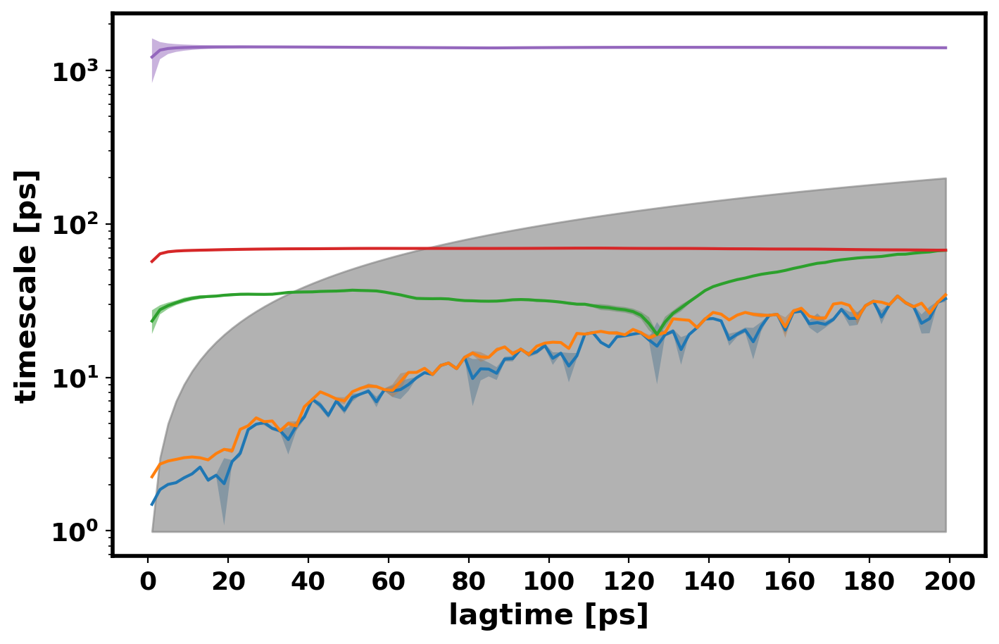

In [135]:
from pylab import *
rc('axes', linewidth=2)
f, ax = plt.subplots(1,1, figsize=(8,5), dpi=200)


for index in range(0,nstates):
    ax.semilogy(lags, mean_its[index])
    ax.fill_between(lags, down_its[index], up_its[index], alpha=0.5)
    # if index != 122:
    #     ax.fill_between(lags, down_its[index], up_its[index], alpha=0.5)
    # else:
    #     ax.fill_between(lags, down_its[index], mean_its[index], alpha=0.5)

ax.set_xticks(np.arange(0,201,20))
ax.set_xticklabels([0,20,40,60,80,100,120,140,160,180,200])
ax.fill_between(lags, lags, 0.99, alpha=0.6, color='grey')

ax.set_xlabel('lagtime [ps]', fontweight='bold', fontsize=15)
ax.set_ylabel('timescale [ps]', fontweight='bold', fontsize=15)


fontsize = 13
ax = gca()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')

plt.savefig('trpcage_its.png')

In [136]:
def get_ck_test(traj, steps, tau, is_list = False):
    if type(traj) == list or is_list:
        n_states = traj[0].shape[1]
    else:
        n_states = traj.shape[1]
    
    predicted = np.zeros((n_states, n_states, steps))
    estimated = np.zeros((n_states, n_states, steps))
    
    predicted[:,:,0] = np.identity(n_states)
    estimated[:,:,0] = np.identity(n_states)
    
    for vector, i in zip(np.identity(n_states), range(n_states)):
        for n in range(1,steps):
            koop = estimate_koopman_op(traj, tau, is_list)
            koop_pred = np.linalg.matrix_power(koop,n)
            koop_est = estimate_koopman_op(traj, tau*n, is_list)
            
            predicted[i,:,n] = vector @ koop_pred
            estimated[i,:,n] = vector @ koop_est
    
    return [predicted, estimated]

In [137]:
preds = []
ests = []
tau = 20
for i in range(n_test):
    pred, est = get_ck_test(transformed[i], steps=10, tau=tau, is_list=True)
    preds.append(pred)
    ests.append(est)

In [138]:
preds = np.array(preds)
ests = np.array(ests)

In [139]:
pred_ord = []
est_ord = []
for i in range(1):
    pred_ord.append(preds[i][state_rel[i][:,None],state_rel[i][None,:]])
    est_ord.append(ests[i][state_rel[i][:,None],state_rel[i][None,:]])

pred_ord = np.array(pred_ord)
est_ord = np.array(est_ord)

In [140]:
mean_pred = np.zeros((nstates,nstates,10))
up_pred = np.zeros((nstates,nstates,10))
down_pred = np.zeros((nstates,nstates,10))

In [141]:
mean_est = np.zeros((nstates,nstates,10))
up_est = np.zeros((nstates,nstates,10))
down_est = np.zeros((nstates,nstates,10))

In [142]:
for i in range(nstates):
    for j in range(nstates):
        for k in range(10):
            mean_pred[i,j,k], up_pred[i,j,k], down_pred[i,j,k] = mean_confidence_interval(pred_ord[:,i,j,k], confidence=0.95)

C:\Users\DS00HY\.conda\envs\pytorch_11.7\lib\site-packages\numpy\core\_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\DS00HY\.conda\envs\pytorch_11.7\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [143]:
for i in range(nstates):
    for j in range(nstates):
        for k in range(10):
            mean_est[i,j,k], up_est[i,j,k], down_est[i,j,k] = mean_confidence_interval(est_ord[:,i,j,k], confidence=0.95)

In [144]:
from matplotlib import rc, rcParams
from pylab import *

rc('axes', linewidth=2)
fontsize = 14

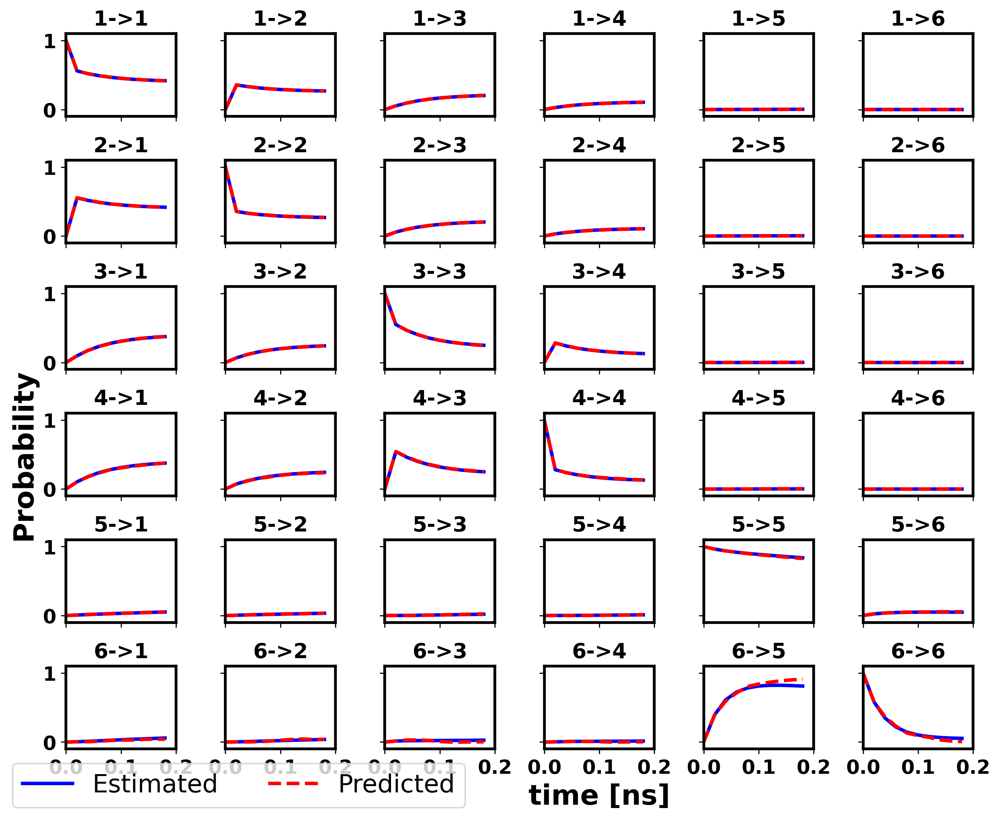

In [145]:
n_states = 6
steps = 10

pred = mean_pred
est = mean_est
t_md = 1
fontsize = 14
fig, ax = plt.subplots(n_states, n_states, sharex=True, sharey=True, figsize=(10,8),dpi=300)
for index_i in range(n_states):
    for index_j in range(n_states):

        #ax[index_i][index_j].plot(range(0, steps*tau, tau), pred[index_i, index_j], color='r', linestyle='-')
        #ax[index_i][index_j].plot(range(0, steps*tau, tau), est[index_i, index_j], color='r', linestyle='--')
        #ax[index_i][index_j].fill_between(range(0, steps*tau, tau), down_est[index_i, index_j], up_est[index_i, index_j], alpha=0.5, color='blue')

        #ax[index_i][index_j].fill_between(range(0, steps*tau, tau), down_pred[index_i, index_j], up_pred[index_i, index_j], alpha=0.3, color='blue')
        ax[index_i][index_j].set_title(str(index_i+1)+'->'+str(index_j+1), fontweight='bold', fontsize=15)
        #ax[index_i][index_j].errorbar(range(0, steps*tau, tau), est[index_i, index_j], est[index_i,index_j]-down_est[index_i, index_j], color='red', alpha=0.6)
        ax[index_i][index_j].plot(range(0, steps*tau, tau), pred[index_i, index_j], color='b', linestyle='-', linewidth =2.5)
        ax[index_i][index_j].plot(range(0, steps*tau, tau), est[index_i, index_j], color='r', linestyle='--',linewidth =2.5)
        #ax[index_i][index_j].plot(range(0, steps*tau, tau), pred[index_i, index_j], color='b', linestyle='--')
        for tick in ax[index_i][index_j].xaxis.get_major_ticks():
            tick.label1.set_fontsize(fontsize)
            tick.label1.set_fontweight('bold')
        for tick in ax[index_i][index_j].yaxis.get_major_ticks():
            tick.label1.set_fontsize(fontsize)
            tick.label1.set_fontweight('bold')
ax[0][0].set_ylim((-0.1, 1.1))
ax[0][0].set_xlim((0, steps*tau))
ax[0][0].axes.get_xaxis().set_ticks(np.round(np.linspace(0, steps*tau, 3)))
#ax[0][0].axes.get_xaxis().set_ticks(np.round(np.linspace(0, steps*tau, 4)))
ax[0][0].axes.set_xticklabels(np.round(np.linspace(0, steps*tau*0.001, 3),2))
plt.tight_layout()
fig.legend(['Estimated', 'Predicted'],loc='lower left', ncol=2,  fontsize=18)
#fig.legend([pred[0], est[0]], ['Estimates', 'Predicted'], 'lower center', ncol=2, bbox_to_anchor=(0.5, -0.1))
ax[n_states-1, n_states//2].set_xlabel('time [ns]', fontweight='bold',fontsize=20)
ax[n_states//2, 0].set_ylabel('Probability', fontweight='bold', fontsize=20)



plt.savefig('trpcage_ck.png')

# Attention results

In [146]:
from typing import Tuple, Sequence, List, Union
import itertools

def unflatten(source: np.ndarray, lengths: List[int]) -> List[np.ndarray]:
    """
    Takes an array and returns a list of arrays.

    Parameters
    ----------
    source
        Array to be unflattened.
    lengths
        List of integers giving the length of each subarray.
        Must sum to the length of source.

    Returns
    -------
    unflat
        List of arrays.

    """
    conv = []
    lp = 0
    for arr in lengths:
        arrconv = []
        for le in arr:
            arrconv.append(source[lp:le + lp])
            lp += le
        conv.append(arrconv)
    ccs = list(itertools.chain(*conv))
    return ccs

In [147]:
#
y_m_t = [] #[n_traj, n_fxx] #
inds = [] #[ n_traj, n_fxx] #
thresh = 0.95
exp = 0 #
exp = 0 #
for i in range(len(transformed[exp])):
    tmp = []
    tmp_ind = []
    for j in range(len(transformed[exp][i])):
        if transformed[exp][i][j].max()>thresh:
            tmp.append(np.argmax(transformed[exp][i][j]))
            tmp_ind.append(j)
    tmp = np.array(tmp)
    tmp_ind = np.array(tmp_ind)
    y_m_t.append(tmp)
    inds.append(tmp_ind)

In [148]:
traj_inds = inds #[ n_traj, n_fxx] #

In [149]:
len(traj_inds)

3

In [150]:
attn = np.load('src/ala_all_1/total_attn.npz')['arr_0']
inds_con = np.load('intermediate/ala_5nbrs_1ns_inds.npy') 

In [151]:
attn.shape

(3, 250000, 10, 5)

In [152]:
traj_length = [np.array([len(i) for i in attn])]
traj_length

[array([250000, 250000, 250000])]

In [153]:
inds = [r for r in unflatten(inds_con, traj_length)] #[n_traj, n_frame, n_atmo, n_neighb]

In [154]:
inds[0].shape

(250000, 10, 5)

In [155]:
def convert_adj(mat, attn):
    # convert the nbr_adj_list matrix to an adjacency matrix
    adj = np.zeros((mat.shape[0], mat.shape[1], mat.shape[1]))
    for i in range(mat.shape[0]):
        adj[i][np.arange(adj.shape[1])[:,None],mat[i]] = attn[i]
    return adj

In [156]:
print(len(inds), len(attn))
adj=[] #[n_taj, n_atom, n_atom]
for i in range(len(inds)):
    adj.append( convert_adj(inds[i], attn[i]))

3 3


In [157]:
adj[0].shape

(250000, 10, 10)

In [158]:
adj[0][0][0]

array([0.00000000e+00, 0.00000000e+00, 6.84557199e-01, 1.12931368e-04,
       0.00000000e+00, 3.05654585e-01, 1.92257019e-08, 0.00000000e+00,
       0.00000000e+00, 9.67525225e-03])

In [159]:
n_states = 6
all_scores = [[] for i in range(n_states)] # [n_states]
#all_trajs = [] #[n_test, n_traj, n_frame]，每一帧属于的类别
for n_j in range(len(adj)): #for n_traj
    #tmp_scores = []
    for i in range(n_states): #for
        if len(adj[n_j][all_trajs[exp][n_j]==i]) > 0 :
            score =  adj[n_j][all_trajs[exp][n_j]==i].mean(axis=0)
            #tmp_scores.append(score)
            all_scores[i].append(score)


In [160]:
#
sc_core = [np.array(sc) for sc in all_scores]
scores = [sc_core[i].mean(axis=0) for i in range(n_states)]

In [161]:
all_scores[0][0].shape

(10, 10)

In [162]:
scores[0][0]

array([0.00000000e+00, 0.00000000e+00, 2.39557331e-02, 3.41550963e-02,
       1.47126463e-04, 1.01618725e-01, 5.34087740e-05, 1.52925226e-01,
       3.41223324e-01, 3.45921362e-01])

In [163]:
y_m_t[0] == 1

array([False, False, False, ..., False, False, False])

In [164]:
sts = [] #[ n_traj]
sts = [ [] for trj in range(n_states)] #[ n_states. n_traj]
for trj in range(len(traj_inds)):
    for i in range(n_states):
        if len(y_m_t[trj] == i) > 0:
            st_0 = traj_inds[trj][y_m_t[trj] == i] #[ n_traj, n_fxx]
            sts[i].append(st_0)

In [165]:
len(sts[0])

3

In [166]:
adjs = []
all_adjs = [ [] for trj in range(n_states)]  #[n_states, n_traj n_states, n_atom, n_atom]
for trj in range(len(traj_inds)):
    for i in range(n_states):
        if len(adj[trj][sts[i][trj]]) > 0 :
            adj_0 = adj[trj][sts[i][trj]].mean(axis=0)
            all_adjs[i].append(adj_0)

In [167]:
#求平均值
sc_adjs = [np.array(sc) for sc in all_adjs]
adjs = [sc_adjs[i].mean(axis=0) for i in range(n_states)]  #[n_states, n_atom, n_atom]

In [168]:
adjs[0].shape

(10, 10)

In [169]:
states_order
#array([2, 0, 1, 3, 5, 4])

array([4, 1, 3, 2, 5, 0])

In [170]:
scores = np.array(scores)[states_order]
sts = np.array(sts)[states_order]
adjs = np.array(adjs)[states_order]

C:\Users\DS00HY\AppData\Local\Temp\ipykernel_34104\2862073588.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  sts = np.array(sts)[states_order]


In [171]:
scores[0][0]

array([0.00000000e+00, 0.00000000e+00, 3.23816051e-01, 3.77326774e-04,
       0.00000000e+00, 1.19398433e-01, 2.25336896e-04, 0.00000000e+00,
       5.41434902e-01, 1.47479505e-02])

In [172]:
scores = adjs

<Figure size 640x480 with 0 Axes>

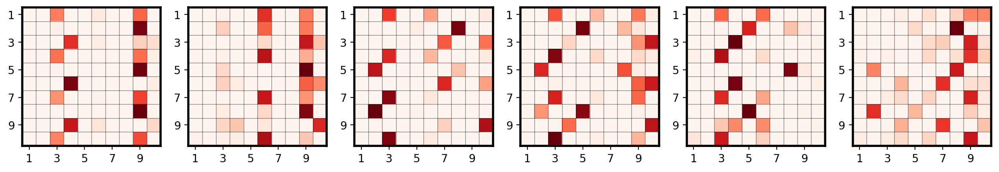

In [173]:
plt.set_cmap('Reds')
fig, axes = plt.subplots(1,6,figsize=(16,3),dpi=200)
n_atoms = 10
x_range = np.arange(0,n_atoms,2)
x_label = np.arange(1,n_atoms+1,2)
for i in range(6):
    axes[i].imshow(scores[i])
    axes[i].hlines(np.arange(0,n_atoms)-0.5,-0.5,n_atoms-0.5,color='k',linewidth=0.5,alpha=0.5)
    axes[i].vlines(np.arange(0,n_atoms)-0.5,-0.5,n_atoms-0.5,color='k',linewidth=0.5,alpha=0.5)
    axes[i].set_xticks(x_range)
    axes[i].set_xticklabels(x_label)
    axes[i].set_yticks(x_range)
    axes[i].set_yticklabels(x_label)

<Figure size 640x480 with 0 Axes>

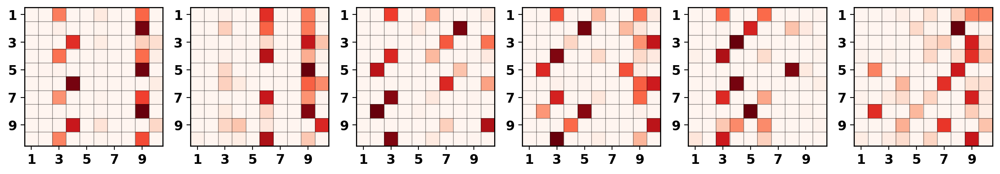

In [174]:
rc('axes', linewidth=1.0)
fontsize = 14
plt.set_cmap('Reds')
fig, axes = plt.subplots(1,n_states,figsize=(16,4),dpi=200)
n_atoms = 10
x_range = np.arange(0,n_atoms,2)
x_label = np.arange(1,n_atoms+1,2)
fontsize = 12
#cbar = plt.colorbar(h, ax=ax, fraction=0.01)
for i in range(n_states):
    axes[i].imshow(scores[i])
    axes[i].hlines(np.arange(0,n_atoms)-0.5,-0.5,n_atoms-0.5,color='k',linewidth=0.5,alpha=0.5)
    axes[i].vlines(np.arange(0,n_atoms)-0.5,-0.5,n_atoms-0.5,color='k',linewidth=0.5,alpha=0.5)
    axes[i].set_xticks(x_range)
    axes[i].set_xticklabels(x_label)
    axes[i].set_yticks(x_range)
    axes[i].set_yticklabels(x_label)
    for tick in axes[i].xaxis.get_major_ticks():
        tick.label1.set_fontsize(fontsize)
        tick.label1.set_fontweight('bold')
    for tick in axes[i].yaxis.get_major_ticks():
        tick.label1.set_fontsize(fontsize)
        tick.label1.set_fontweight('bold')
getidx = 0
plt.savefig('trpcage_attn_pp-%i.png'%getidx)

In [175]:
states_order

array([4, 1, 3, 2, 5, 0])

In [176]:
def scale(score):
    score_min = score.min()
    score_max = score.max()
    if score_max == score_min:
        print(score_max)
    ret = (score-score_min)/(score_max-score_min)
    return ret

In [177]:
scores_p = np.stack((scale(scores[0].sum(axis=0)), scale(scores[1].sum(axis=0)), scale(scores[2].sum(axis=0)), scale(scores[3].sum(axis=0)), scale(scores[4].sum(axis=0)),scale(scores[5].sum(axis=0))))

In [178]:
residues = ['CH3-ACE','C-ACE','O-ACE','N-ALA','CA-ALA','CB-ALA','C-ALA','O-ALA',
           'N-NME','CH3-NME']

C:\Users\DS00HY\AppData\Local\Temp\ipykernel_34104\1181055309.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([i for i in range(n_states+1)])


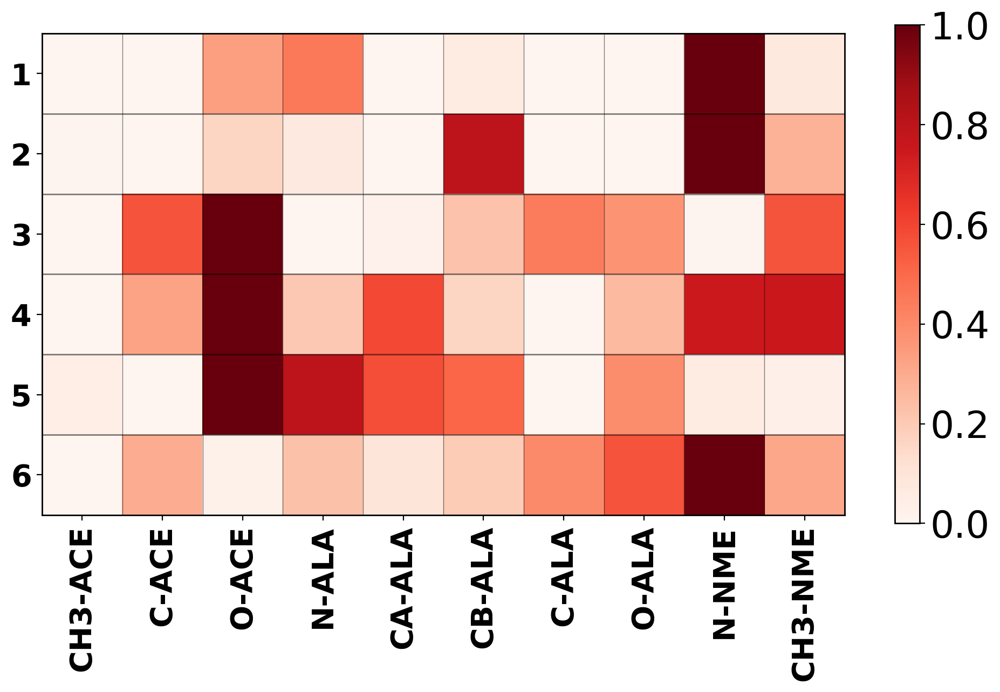

In [179]:
from pylab import *
fig, ax = plt.subplots(1,1,figsize=(12,6),dpi=200)
h=ax.imshow(scores_p)
ax.set_xticks(np.arange(n_atoms))
ax.set_xticklabels(residues,fontweight='bold', rotation=90)
ax.set_yticklabels([i for i in range(n_states+1)])
ax.hlines(np.arange(0,n_states)-0.5,-0.5,n_atoms-0.5,color='k',linewidth=1,alpha=0.5)
ax.vlines(np.arange(0,n_atoms)-0.5,-0.5,n_states-0.5,color='k',linewidth=0.5,alpha=0.5)
cbar = plt.colorbar(h, ax=ax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(25)

fontsize = 20
ax = gca()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')
    
plt.savefig('trpcage_attn_all.png')